# [ LG에너지솔루션 DX Expert 양성과정 - Auto-Encoder #2]

Deep Auto-Encoder를 활용한 image anomaly detection

## 강의 복습
강의자료: Deep Auto-Encoder
- `Convolutional Auto-Encoder`: 이미지 자체를 취급하는 Auto-Encoder, Convolutional layer를 활용

<img src="https://github.com/hwk0702/2024_LG_ES_External_Lecture/blob/main/240702_Deep_Auto_Encoder/image/CAE01.png?raw=true" width="600">

## 실습 요약

1. 본 실습에서는 Convolutional Auto-Encoder(CAE)를 활용하여 이미지에서의 이상탐지를 수행합니다.

---

## Import modules

In [1]:
# 필요한 라이브러리 임포트
from glob import glob
import os
import random
import numpy as np
import cv2
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import SGD, Adam
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from sklearn.metrics import roc_auc_score

import matplotlib.pyplot as plt
import seaborn as sns

# Seaborn 플롯 스타일 설정
custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)

# Functions

In [2]:
def torch_seed(random_seed):
    """
    시드를 설정하여 재현성을 확보합니다.
    """
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)  # if use multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(random_seed)
    random.seed(random_seed)
    os.environ['PYTHONHASHSEED'] = str(random_seed)

def train(model, dataloader, criterion, optimizer, log_interval: int, device: str) -> float:
    """
    모델을 학습시킵니다.
    :param model: 학습할 모델
    :param dataloader: 학습 데이터 로더
    :param criterion: 손실 함수
    :param optimizer: 옵티마이저
    :param log_interval: 로그 출력 간격
    :param device: 사용 디바이스
    :return: 평균 손실
    """
    total_loss = []

    model.train()
    for i, (inputs, _, _) in enumerate(dataloader):

        # convert device
        inputs = inputs.to(device)

        # model outputs
        outputs = model(inputs)

        # loss
        loss = criterion(inputs, outputs).mean()
        total_loss.append(loss.item())

        # calculate gradients
        loss.backward()

        # update model weights
        optimizer.step()
        optimizer.zero_grad()

        # log learning history
        if i % log_interval == 0 or (i+1) == len(dataloader):
            print(f"{'TRAIN':5s} [{i+1:5d}/{len(dataloader):5d}] loss: {np.mean(total_loss):.4f}")

    # average loss
    avg_loss = np.mean(total_loss)

    return avg_loss

def test(model, dataloader, criterion, log_interval: int, device: str) -> tuple:
    """
    모델을 테스트합니다.
    :param model: 테스트할 모델
    :param dataloader: 테스트 데이터 로더
    :param criterion: 손실 함수
    :param log_interval: 로그 출력 간격
    :param device: 사용 디바이스
    :return: 이미지 레벨 및 픽셀 레벨의 AUROC
    """

    # for image-level auroc
    total_loss_img = []
    total_targets = []
    # for pixel-level auroc
    total_masks = []
    total_loss_pixel = []

    torch_seed(223)
    model.eval()

    with torch.no_grad():
        for i, (inputs, masks, targets) in enumerate(dataloader):
            # get masks
            total_masks.append(masks.numpy())

            # get targets
            total_targets.extend(targets.tolist())

            # convert device
            inputs = inputs.to(device)

            # model outputs
            outputs = model(inputs)

            # loss
            loss = criterion(inputs, outputs)
            total_loss_img.extend(loss.flatten(start_dim=1).max(dim=1)[0].cpu().tolist())
            total_loss_pixel.append(loss.max(dim=1)[0].cpu().numpy())

            # log learning history
            if i % log_interval == 0 or (i+1) == len(dataloader):
                print(f"{'TSET':5s} [{i+1:5d}/{len(dataloader):5d}] loss: {np.mean(total_loss_img):.4f}")

    # image-level auroc
    auroc_img = roc_auc_score(total_targets, total_loss_img)

    # pixel-level auroc
    total_loss_pixel = np.vstack(total_loss_pixel).reshape(-1)
    total_masks = np.vstack(total_masks).reshape(-1)
    auroc_pixel = roc_auc_score(total_masks, total_loss_pixel)

    # return
    return auroc_img, auroc_pixel


def fit(model, trainloader, testloader, criterion, optimizer, epochs: int, log_interval: int, device: str) -> tuple:
    """
    모델을 학습시키고 평가합니다.
    :param model: 학습할 모델
    :param trainloader: 학습 데이터 로더
    :param testloader: 테스트 데이터 로더
    :param criterion: 손실 함수
    :param optimizer: 옵티마이저
    :param epochs: 학습 에폭 수
    :param log_interval: 로그 출력 간격
    :param device: 사용 디바이스
    :return: 학습 손실, 테스트 이미지 레벨 및 픽셀 레벨 AUROC 히스토리
    """

    train_history = []
    test_history_auroc_img = []
    test_history_auroc_pixel = []

    # fitting model
    for i in range(epochs):
        print(f'\nEpoch: [{i+1}/{epochs}]')
        train_loss = train(
            model        = model,
            dataloader   = trainloader,
            criterion    = criterion,
            optimizer    = optimizer,
            log_interval = log_interval,
            device       = device
        )

        test_auroc_img, test_auroc_pixel = test(
            model        = model,
            dataloader   = testloader,
            criterion    = criterion,
            log_interval = log_interval,
            device       = device
        )

        print(f'\nTest AUROC-image: {test_auroc_img:.4f}, AUROC-pixel: {test_auroc_pixel:.4f}')

        # show results
        with torch.no_grad():
            test_category = testloader.dataset.category
            fig, ax = plt.subplots(2, len(test_category), figsize=(2*len(test_category), 5))

            file_list_cat = list(map(lambda x: x.split('/')[-2], testloader.dataset.file_list))

            for i, c in enumerate(test_category):
                # select image per category
                idx = np.where(np.array(file_list_cat) == c)[0][0]
                img, mask, _ = testset[idx]

                # inference
                output = model(img.unsqueeze(0).to(device)).cpu()[0]

                # show image
                ax[0, i].imshow(img.permute(1,2,0))
                ax[1, i].imshow(output.permute(1,2,0))

                # axis off
                ax[0, i].axis('off')
                ax[1, i].axis('off')

                # set title
                ax[0, i].set_title(f"{c}\nimage")
                ax[1, i].set_title(f"{c}\nreconstruction")
            plt.tight_layout()
            plt.show()

        # stack history
        train_history.append(train_loss)
        test_history_auroc_img.append(test_auroc_img)
        test_history_auroc_pixel.append(test_auroc_pixel)

    return train_history, test_history_auroc_img, test_history_auroc_pixel


def figure(all_train_history: list, all_test_history_auroc_img: list, all_test_history_auroc_pixel: list, all_exp_name: list) -> None:
    """
    학습 및 테스트 히스토리를 시각화합니다.
    :param all_train_history: 모든 실험의 학습 손실 히스토리 리스트
    :param all_test_history_auroc_img: 모든 실험의 테스트 이미지 레벨 AUROC 히스토리 리스트
    :param all_test_history_auroc_pixel: 모든 실험의 테스트 픽셀 레벨 AUROC 히스토리 리스트
    :param all_exp_name: 모든 실험의 이름 리스트
    """

    fig, ax = plt.subplots(1, 3, figsize=(15,5))

    # train line plot
    for i, (train_h, exp_name) in enumerate(zip(all_train_history, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(train_h)+1),
            y     = train_h,
            label = exp_name,
            ax    = ax[0]
        )

    # test image-level AUROC lineplot
    for i, (test_h, exp_name) in enumerate(zip(all_test_history_auroc_img, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(test_h)+1),
            y     = test_h,
            label = exp_name,
            ax    = ax[1]
        )

    # test pixel-level AUROC lineplot
    for i, (test_h, exp_name) in enumerate(zip(all_test_history_auroc_pixel, all_exp_name)):
        sns.lineplot(
            x     = range(1, len(test_h)+1),
            y     = test_h,
            label = exp_name,
            ax    = ax[2]
        )

    # set y axis label
    ax[0].set_ylabel('MSE Loss')
    ax[1].set_ylabel('AUROC(image-level)')
    ax[2].set_ylabel('AUROC(pixel-level)')

    # set x axis label
    ax[0].set_xlabel('Epochs')
    ax[1].set_xlabel('Epochs')
    ax[2].set_xlabel('Epochs')

    # set title
    ax[0].set_title('Train loss history')
    ax[1].set_title('Test AUROC(image-level) history')
    ax[2].set_title('Test AUROC(pixel-level) history')

    # set y value limit
    max_train = np.max(all_train_history)

    ax[0].set_ylim(0, max_train+0.01)
    ax[1].set_ylim(0, 1)
    ax[2].set_ylim(0, 1)

    # set legend
    ax[0].legend(loc='upper left')
    ax[1].legend(loc='upper left')
    ax[2].legend(loc='upper left')
    plt.tight_layout()
    plt.show()

# Configuration for experiments

In [3]:
class Config:
    """
    실험 설정을 담고 있는 클래스
    """

    # dataset 관련 parameters
    datadir = './data'            # 데이터셋 디렉토리 경로
    target = 'bottle'             # 목표 클래스 (예: 'bottle')
    image_size = [224, 224]       # 이미지 크기

    # training 관련 parameters
    epochs = 20                   # 총 학습 에폭 수
    batch_size = 8                # 학습 데이터 배치 크기
    test_batch_size = 128         # 테스트 데이터 배치 크기
    learning_rate = 0.01          # 학습률
    num_workers = 2               # 데이터 로딩을 위한 워커 수
    log_interval = 2000           # 로그 출력 간격

    # device
    device = 'cuda'               # 학습을 위한 디바이스 (cuda 또는 cpu)

    # seed
    seed = 223                     # 시드 값 (재현성 확보를 위해 고정)

# Config 클래스의 인스턴스를 생성
cfg = Config()

# Load dataset and dataloader

**Download data**
- MVTec AD [ [link](https://www.mvtec.com/company/research/datasets/mvtec-ad) ]

In [4]:
!wget -P './data' 'https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937370-1629951468/bottle.tar.xz'
!tar Jxvf ./data/bottle.tar.xz -C ./data

--2024-06-30 07:21:32--  https://www.mydrive.ch/shares/38536/3830184030e49fe74747669442f0f282/download/420937370-1629951468/bottle.tar.xz
Resolving www.mydrive.ch (www.mydrive.ch)... 91.214.169.64
Connecting to www.mydrive.ch (www.mydrive.ch)|91.214.169.64|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 155880244 (149M) [application/x-xz]
Saving to: ‘./data/bottle.tar.xz.2’

bottle.tar.xz.2     100%[===================>] 148.66M  10.6MB/s    in 16s     

2024-06-30 07:21:50 (9.19 MB/s) - ‘./data/bottle.tar.xz.2’ saved [155880244/155880244]

bottle/
bottle/ground_truth/
bottle/ground_truth/broken_large/
bottle/ground_truth/broken_large/015_mask.png
bottle/ground_truth/broken_large/016_mask.png
bottle/ground_truth/broken_large/017_mask.png
bottle/ground_truth/broken_large/018_mask.png
bottle/ground_truth/broken_large/019_mask.png
bottle/ground_truth/broken_large/000_mask.png
bottle/ground_truth/broken_large/001_mask.png
bottle/ground_truth/broken_large/002_mask.

```bash
./data/bottle
├── ground_truth
│   ├── broken_large
│   ├── broken_small
│   └── contamination
├── license.txt
├── readme.txt
├── test
│   ├── broken_large
│   ├── broken_small
│   ├── contamination
│   └── good
└── train
    └── good
```

In [5]:
# 학습 및 테스트 이미지 개수 출력
print('[ trainset ]')
# 학습용 'good' 이미지 개수 출력
train_good_images = len(glob(os.path.join(cfg.datadir, cfg.target, 'train/good/*')))
print(f"train good images: {train_good_images}")

print('\n[ testset ]')
testdir = os.path.join(cfg.datadir, cfg.target, 'test')

# 각 테스트 이미지 클래스별 이미지 개수 출력
for name in os.listdir(testdir):
    test_images = len(glob(os.path.join(testdir, name, '*')))
    print(f"test {name} images: {test_images}")

[ trainset ]
train good images: 209

[ testset ]
test good images: 20
test contamination images: 21
test broken_large images: 20
test broken_small images: 22


In [6]:
class MVTecAD(Dataset):
    def __init__(self, datadir: str, target: str, train: bool, img_size: list, transform: transforms.Compose):
        """
        MVTecAD 데이터셋 클래스 초기화
        :param datadir: 데이터 디렉토리 경로
        :param target: 타겟 클래스 (예: 'bottle')
        :param train: 학습용 데이터 여부 (True: 학습용, False: 테스트용)
        :param img_size: 이미지 크기 (리스트 형식)
        :param transform: 이미지 변환 함수
        """

        self.datadir = os.path.join(datadir, target)
        self.train = train

        self.category = os.listdir(os.path.join(self.datadir, 'train' if train else 'test'))

        self.img_size = img_size
        self.transform = transform

        self.file_list = glob(os.path.join(self.datadir, 'train' if self.train else 'test', '*/*'))


    def __getitem__(self, idx):
        """
        데이터셋에서 하나의 샘플을 가져옵니다.
        :param idx: 샘플 인덱스
        :return: 이미지, 마스크, 타겟
        """
        file_path = self.file_list[idx]

        # image
        img = cv2.imread(file_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, dsize=self.img_size)

        # target
        target = 0 if 'good' in file_path else 1

        # mask
        if 'good' in file_path:
            mask = np.zeros(self.img_size, dtype=np.float32)
        else:
            mask = cv2.imread(
                file_path.replace('test','ground_truth').replace('.png','_mask.png'),
                cv2.IMREAD_GRAYSCALE
            )
            mask = cv2.resize(mask, dsize=self.img_size).astype(bool).astype(int)

        img = self.transform(img)
        mask = torch.Tensor(mask).to(torch.int64)

        return img, mask, target

    def __len__(self):
        """
        데이터셋의 샘플 수를 반환합니다.
        :return: 데이터셋 샘플 수
        """
        return len(self.file_list)

In [7]:
# 학습 데이터셋 정의
trainset = MVTecAD(
    datadir=cfg.datadir,          # 데이터 디렉토리 경로
    target=cfg.target,            # 타겟 클래스 (예: 'bottle')
    img_size=cfg.image_size,      # 이미지 크기
    transform=transforms.ToTensor(),  # 이미지 변환 함수
    train=True                    # 학습용 데이터 여부 (True)
)

# 테스트 데이터셋 정의
testset = MVTecAD(
    datadir=cfg.datadir,          # 데이터 디렉토리 경로
    target=cfg.target,            # 타겟 클래스 (예: 'bottle')
    img_size=cfg.image_size,      # 이미지 크기
    transform=transforms.ToTensor(),  # 이미지 변환 함수
    train=False                   # 테스트용 데이터 여부 (False)
)

# 학습 데이터로더 정의
trainloader = DataLoader(
    trainset,                     # 학습 데이터셋
    batch_size=cfg.batch_size,    # 배치 크기
    shuffle=True,                 # 데이터 순서 섞기 여부
    num_workers=cfg.num_workers   # 데이터 로딩을 위한 워커 수
)

# 테스트 데이터로더 정의
testloader = DataLoader(
    testset,                      # 테스트 데이터셋
    batch_size=cfg.test_batch_size,  # 배치 크기
    shuffle=False,                # 데이터 순서 섞지 않기
    num_workers=cfg.num_workers   # 데이터 로딩을 위한 워커 수
)

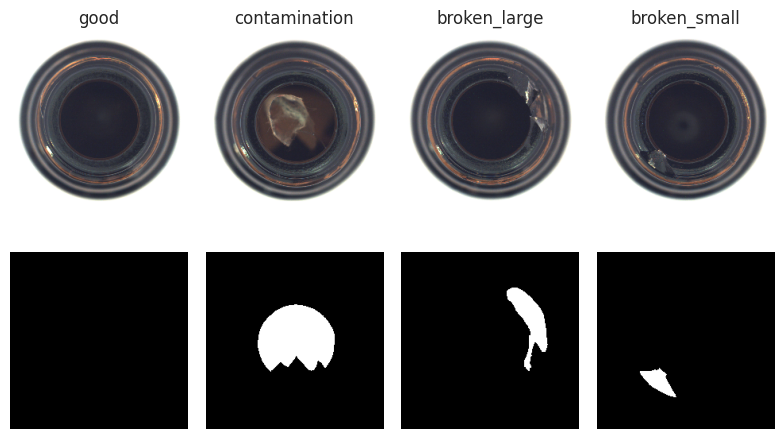

In [8]:
# 테스트 데이터셋의 카테고리별 이미지 시각화
fig, ax = plt.subplots(2, len(testset.category), figsize=(2 * len(testset.category), 5))

# 파일 리스트에서 카테고리 정보를 추출
file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))

for i, c in enumerate(testset.category):
    # 해당 카테고리의 첫 번째 이미지 인덱스 찾기
    idx = np.where(np.array(file_list_cat) == c)[0][0]
    img, mask, _ = testset[idx]

    # 이미지 시각화
    ax[0, i].imshow(img.permute(1, 2, 0))  # 채널 순서 변경 (C, H, W) -> (H, W, C)
    ax[1, i].imshow(mask, cmap='gray')     # 마스크 시각화 (회색조)

    # 축을 끄기
    ax[0, i].axis('off')
    ax[1, i].axis('off')

    # 타이틀 설정
    ax[0, i].set_title(c)

# 레이아웃 조정 및 그래프 출력
plt.tight_layout()
plt.show()

# Convolutional Auto-Encoder

In [9]:
class ConvolutionalAutoEncoder(nn.Module):
    def __init__(self, input_dim: int, dims: list):
        """
        ConvolutionalAutoEncoder 클래스 초기화
        :param input_dim: 입력 이미지의 채널 수
        :param dims: 인코더 및 디코더의 각 층의 채널 수 리스트
        """
        super(ConvolutionalAutoEncoder, self).__init__()

        # 인코더와 디코더의 채널 수 설정
        dims = [input_dim] + dims

        # 인코더 및 디코더 생성
        self.enc = nn.Sequential(*self.build_layer(dims=dims))
        self.dec = nn.Sequential(*self.build_layer(dims=dims[::-1], up=True))
        self.output = nn.Conv2d(
            in_channels=input_dim,
            out_channels=input_dim,
            kernel_size=3,
            padding=1
        )

    def build_layer(self, dims, up=False):
        """
        인코더 또는 디코더 층을 생성하는 함수
        :param dims: 각 층의 채널 수 리스트
        :param up: 디코더 층 생성을 위한 플래그
        :return: 생성된 층 리스트
        """
        layers = []

        for i in range(1, len(dims)):
            if up:
                layer_i = [
                    nn.ConvTranspose2d(
                        in_channels=dims[i - 1],
                        out_channels=dims[i],
                        kernel_size=2,
                        stride=2
                    ),
                    nn.ReLU()
                ]
            else:
                layer_i = [
                    nn.Conv2d(
                        in_channels=dims[i - 1],
                        out_channels=dims[i],
                        kernel_size=3,
                        padding=1
                    ),
                    nn.ReLU(),
                    nn.MaxPool2d(kernel_size=2, stride=2)
                ]
            layers.extend(layer_i)

        return layers

    def encoder(self, x):
        """
        인코더를 통해 입력 데이터를 변환
        :param x: 입력 데이터
        :return: 인코더를 거친 출력
        """
        return self.enc(x)

    def decoder(self, x):
        """
        디코더를 통해 인코더 출력 데이터를 원래 차원으로 변환
        :param x: 인코더 출력 데이터
        :return: 디코더를 거친 최종 출력
        """
        x = self.dec(x)
        x = self.output(x)
        x = torch.sigmoid(x)
        return x

    def forward(self, x):
        """
        순전파 함수
        :param x: 입력 데이터
        :return: AutoEncoder의 최종 출력
        """
        x = self.encoder(x)
        x = self.decoder(x)
        return x

## CAE - shallow

In [10]:
# 시드 설정
torch_seed(cfg.seed)

# ConvolutionalAutoEncoder 모델 생성
cae_shallow = ConvolutionalAutoEncoder(input_dim=3, dims=[32, 64])

# 모델을 지정된 장치(CPU 또는 GPU)로 이동
cae_shallow.to(cfg.device)

# 모델 로드 메시지 출력
print('Load Convolutional Auto-Encoder')

# 모델 파라미터의 총 개수를 출력
print('The number of model parameters: ', sum(p.numel() for p in cae_shallow.parameters()))

# 손실 함수 설정
# MSELoss (Mean Squared Error Loss) 함수를 사용하며, reduction을 'none'으로 설정하여 개별 손실 값을 유지
criterion = nn.MSELoss(reduction='none')

# 옵티마이저 설정
# Adam 옵티마이저를 사용하며, 학습률은 cfg에서 설정된 learning_rate를 사용
optimizer = Adam(cae_shallow.parameters(), lr=cfg.learning_rate)

Load Convolutional Auto-Encoder
The number of model parameters:  28087



Epoch: [1/20]
TRAIN [    1/   27] loss: 0.1329
TRAIN [   27/   27] loss: 0.0422
TSET  [    1/    1] loss: 0.4491

Test AUROC-image: 0.8079, AUROC-pixel: 0.5631


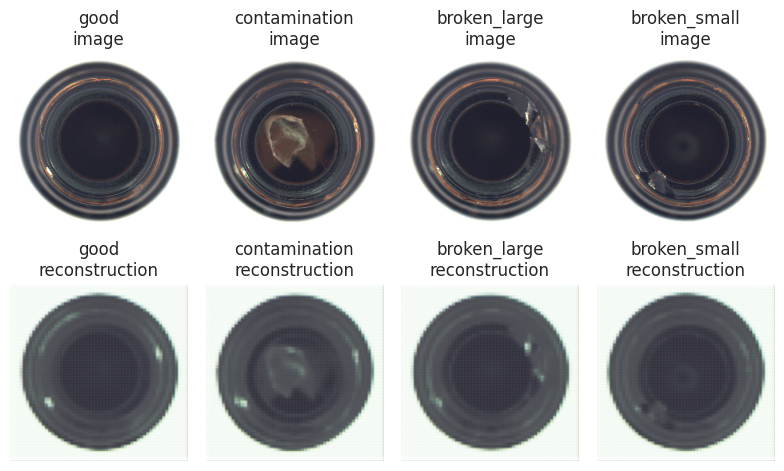


Epoch: [2/20]
TRAIN [    1/   27] loss: 0.0080
TRAIN [   27/   27] loss: 0.0046
TSET  [    1/    1] loss: 0.4230

Test AUROC-image: 0.8270, AUROC-pixel: 0.5503


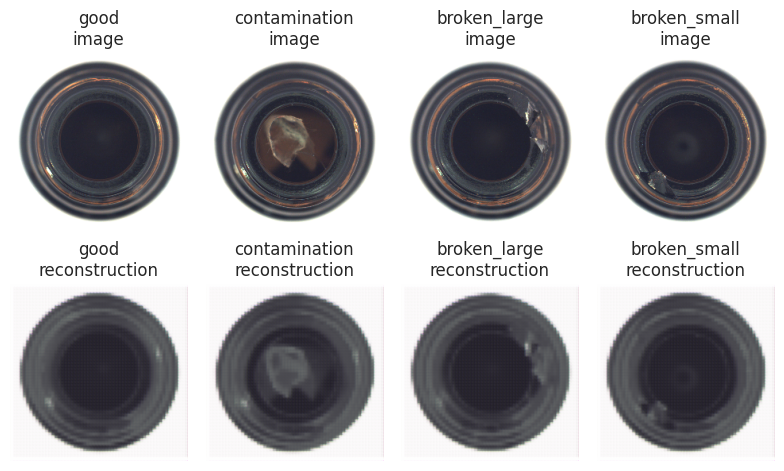


Epoch: [3/20]
TRAIN [    1/   27] loss: 0.0031
TRAIN [   27/   27] loss: 0.0026
TSET  [    1/    1] loss: 0.3939

Test AUROC-image: 0.7921, AUROC-pixel: 0.6404


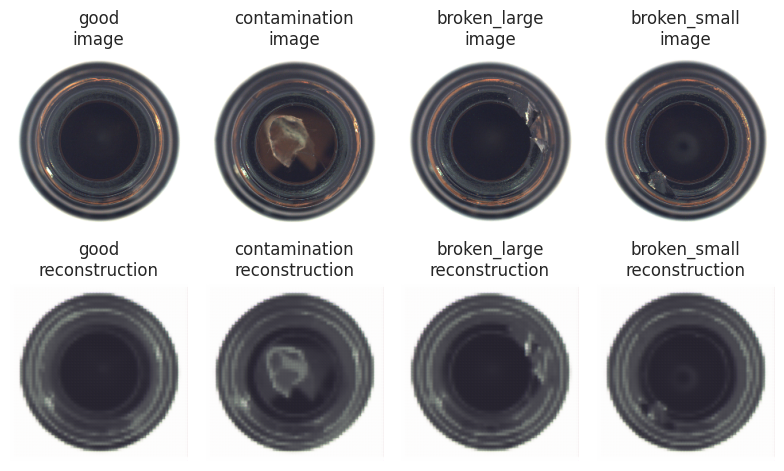


Epoch: [4/20]
TRAIN [    1/   27] loss: 0.0025
TRAIN [   27/   27] loss: 0.0022
TSET  [    1/    1] loss: 0.3764

Test AUROC-image: 0.8294, AUROC-pixel: 0.6599


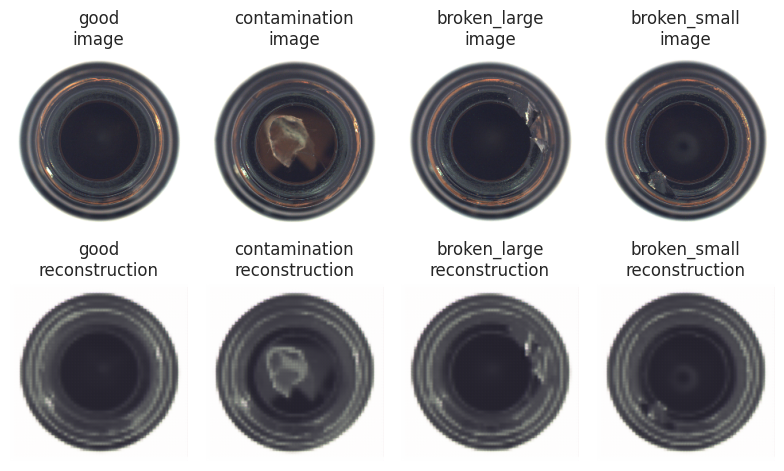


Epoch: [5/20]
TRAIN [    1/   27] loss: 0.0023
TRAIN [   27/   27] loss: 0.0018
TSET  [    1/    1] loss: 0.3826

Test AUROC-image: 0.8119, AUROC-pixel: 0.6246


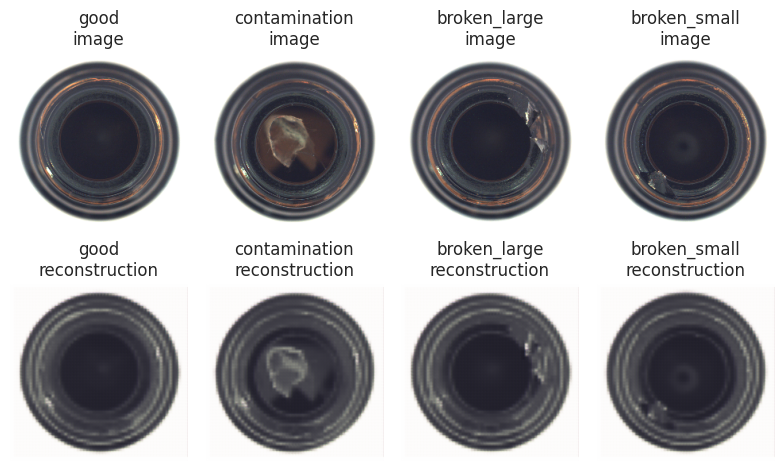


Epoch: [6/20]
TRAIN [    1/   27] loss: 0.0016
TRAIN [   27/   27] loss: 0.0226
TSET  [    1/    1] loss: 0.5046

Test AUROC-image: 0.8079, AUROC-pixel: 0.6531


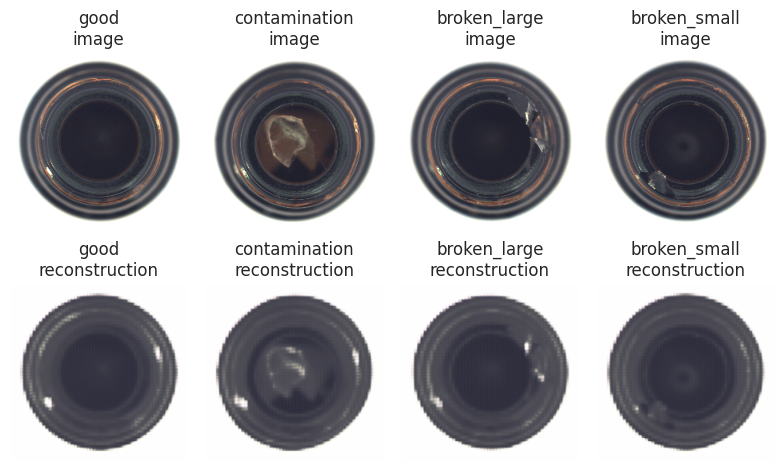


Epoch: [7/20]
TRAIN [    1/   27] loss: 0.0109
TRAIN [   27/   27] loss: 0.0165
TSET  [    1/    1] loss: 0.4602

Test AUROC-image: 0.7976, AUROC-pixel: 0.4922


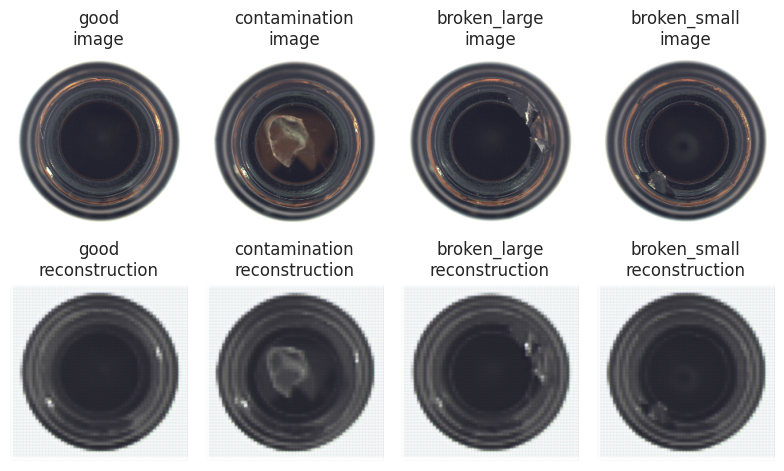


Epoch: [8/20]
TRAIN [    1/   27] loss: 0.0041
TRAIN [   27/   27] loss: 0.0028
TSET  [    1/    1] loss: 0.4247

Test AUROC-image: 0.7754, AUROC-pixel: 0.6504


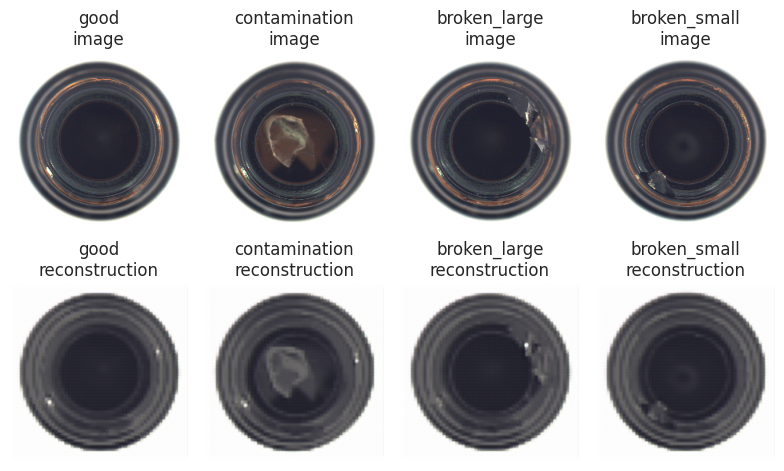


Epoch: [9/20]
TRAIN [    1/   27] loss: 0.0021
TRAIN [   27/   27] loss: 0.0018
TSET  [    1/    1] loss: 0.3883

Test AUROC-image: 0.7746, AUROC-pixel: 0.6407


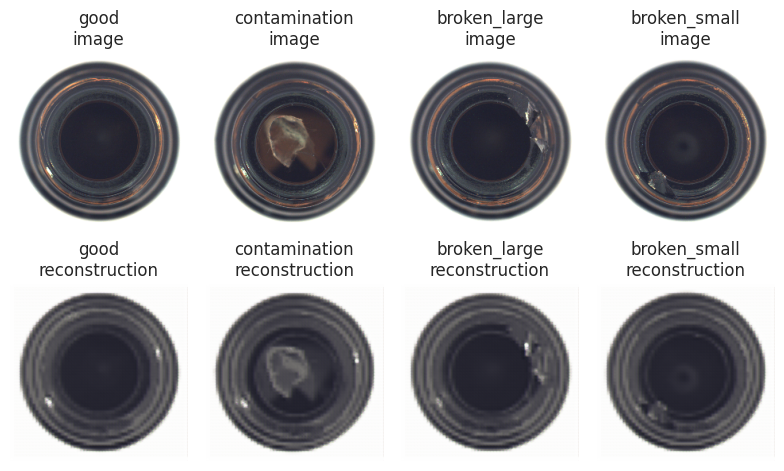


Epoch: [10/20]
TRAIN [    1/   27] loss: 0.0017
TRAIN [   27/   27] loss: 0.0015
TSET  [    1/    1] loss: 0.3603

Test AUROC-image: 0.8349, AUROC-pixel: 0.6644


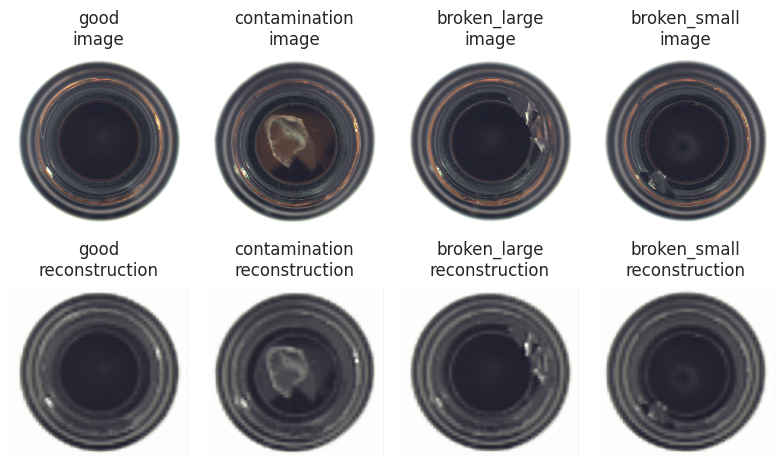


Epoch: [11/20]
TRAIN [    1/   27] loss: 0.0014
TRAIN [   27/   27] loss: 0.0012
TSET  [    1/    1] loss: 0.3483

Test AUROC-image: 0.7524, AUROC-pixel: 0.6870


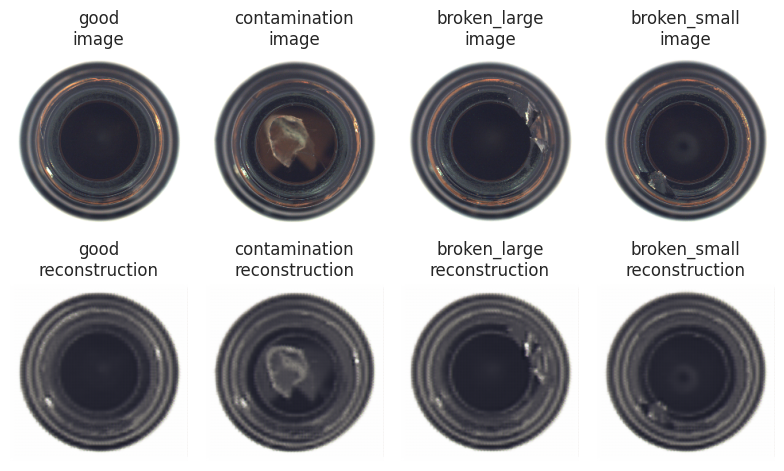


Epoch: [12/20]
TRAIN [    1/   27] loss: 0.0012
TRAIN [   27/   27] loss: 0.0011
TSET  [    1/    1] loss: 0.3432

Test AUROC-image: 0.7278, AUROC-pixel: 0.6930


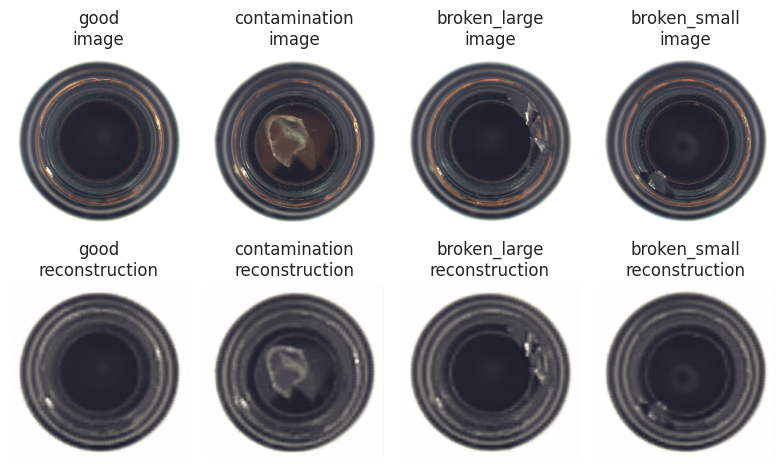


Epoch: [13/20]
TRAIN [    1/   27] loss: 0.0011
TRAIN [   27/   27] loss: 0.0010
TSET  [    1/    1] loss: 0.3397

Test AUROC-image: 0.7198, AUROC-pixel: 0.6974


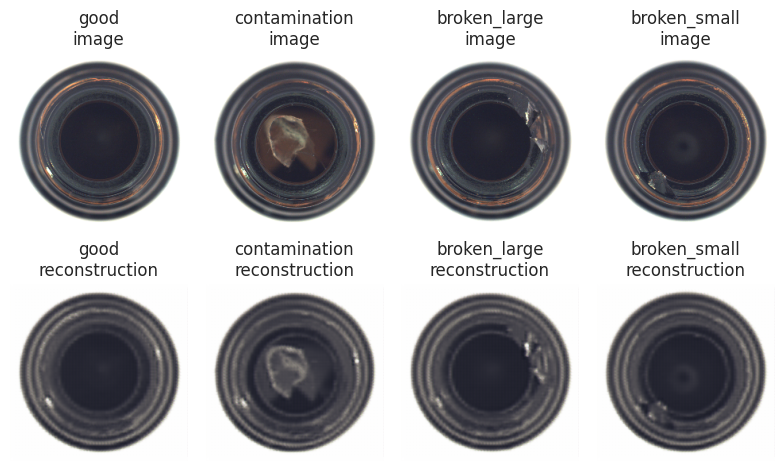


Epoch: [14/20]
TRAIN [    1/   27] loss: 0.0011
TRAIN [   27/   27] loss: 0.0010
TSET  [    1/    1] loss: 0.3364

Test AUROC-image: 0.7135, AUROC-pixel: 0.7008


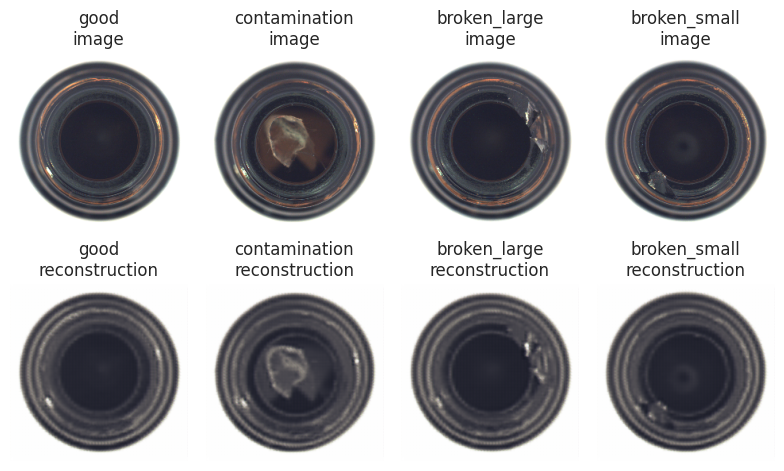


Epoch: [15/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0010
TSET  [    1/    1] loss: 0.3355

Test AUROC-image: 0.7183, AUROC-pixel: 0.7037


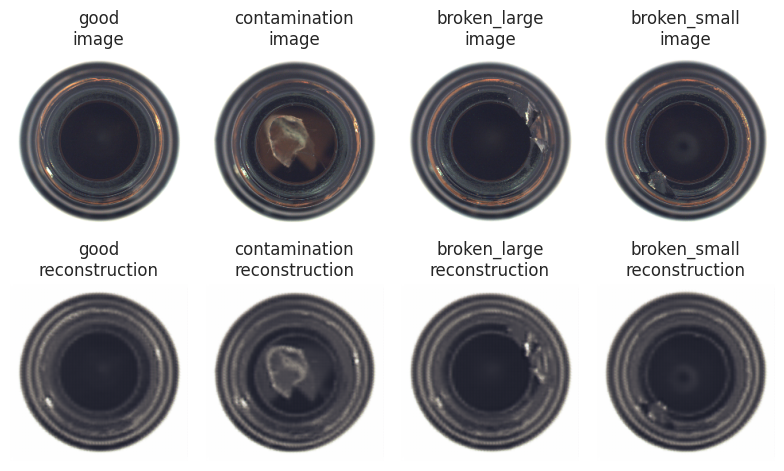


Epoch: [16/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0010
TSET  [    1/    1] loss: 0.3355

Test AUROC-image: 0.7238, AUROC-pixel: 0.7053


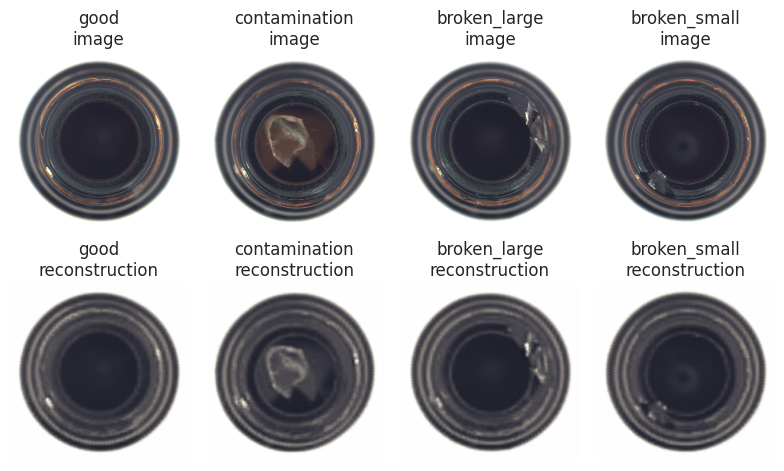


Epoch: [17/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0010
TSET  [    1/    1] loss: 0.3358

Test AUROC-image: 0.7278, AUROC-pixel: 0.7062


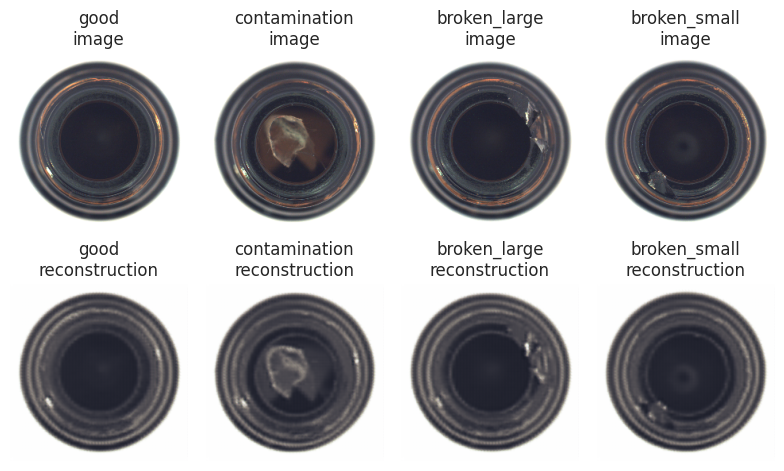


Epoch: [18/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0009
TSET  [    1/    1] loss: 0.3361

Test AUROC-image: 0.7294, AUROC-pixel: 0.7072


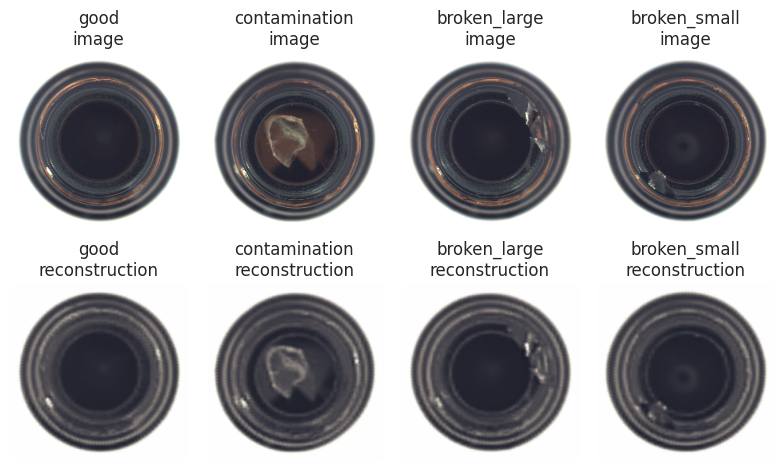


Epoch: [19/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0009
TSET  [    1/    1] loss: 0.3361

Test AUROC-image: 0.7183, AUROC-pixel: 0.7078


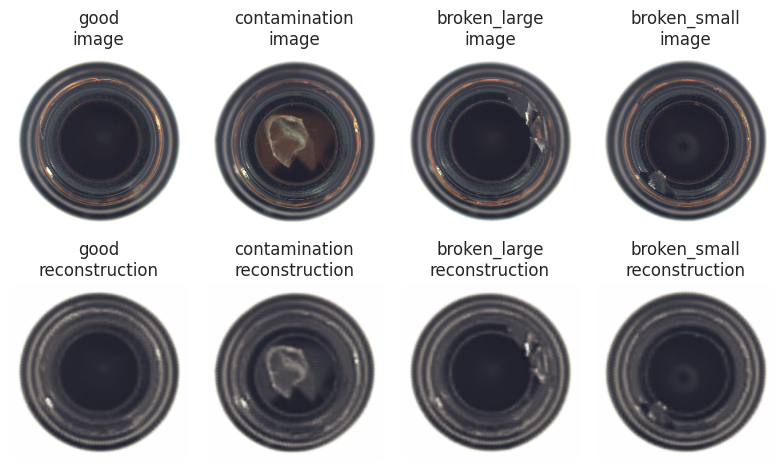


Epoch: [20/20]
TRAIN [    1/   27] loss: 0.0010
TRAIN [   27/   27] loss: 0.0009
TSET  [    1/    1] loss: 0.3367

Test AUROC-image: 0.7111, AUROC-pixel: 0.7085


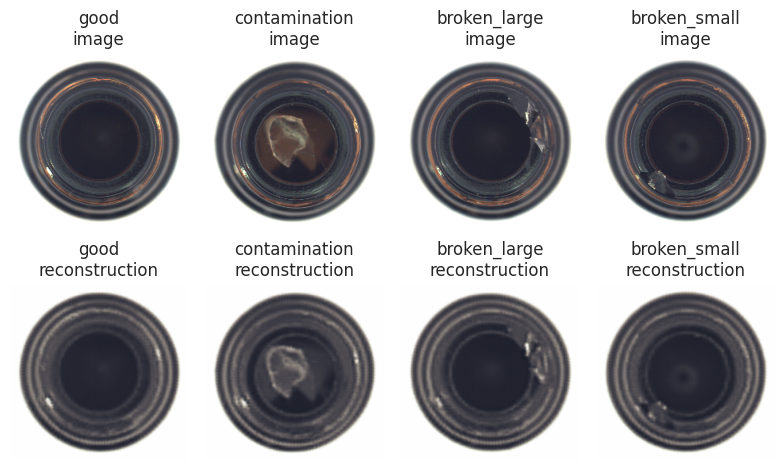

Training completed.


In [11]:
# 시드 설정
torch_seed(cfg.seed)

# Convolutional AutoEncoder 모델 학습 및 평가
train_history_cae_shallow, test_history_auroc_img_cae_shallow, test_history_auroc_pixel_cae_shallow = fit(
    model=cae_shallow,              # 학습할 모델
    trainloader=trainloader,        # 학습 데이터 로더
    testloader=testloader,          # 테스트 데이터 로더
    criterion=criterion,            # 손실 함수
    optimizer=optimizer,            # 옵티마이저
    epochs=cfg.epochs,              # 학습 에폭 수
    log_interval=cfg.log_interval,  # 로그 출력 간격
    device=cfg.device               # 학습에 사용할 디바이스
)

print("Training completed.")

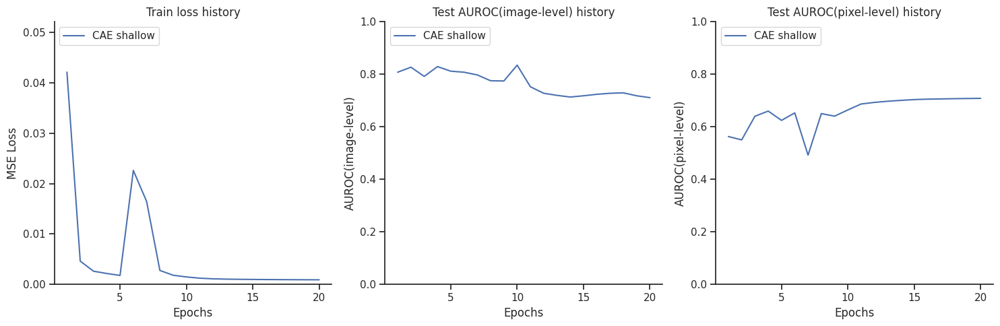

In [12]:
# 학습 및 평가 히스토리 리스트 정의
all_train_history = [train_history_cae_shallow]
all_test_history_auroc_img = [test_history_auroc_img_cae_shallow]
all_test_history_auroc_pixel = [test_history_auroc_pixel_cae_shallow]
all_exp_name = ['CAE shallow']

# 학습 및 평가 히스토리 시각화
figure(
    all_train_history=all_train_history,                    # 학습 손실 히스토리 리스트
    all_test_history_auroc_img=all_test_history_auroc_img,  # 테스트 이미지 레벨 AUROC 히스토리 리스트
    all_test_history_auroc_pixel=all_test_history_auroc_pixel,  # 테스트 픽셀 레벨 AUROC 히스토리 리스트
    all_exp_name=all_exp_name  # 실험 이름 리스트
)

## CAE - deep

In [13]:
# 시드 설정
torch_seed(cfg.seed)

# 깊은 Convolutional AutoEncoder 모델 생성
cae_deep = ConvolutionalAutoEncoder(input_dim=3, dims=[32, 64, 128, 256, 512])

# 모델을 지정된 장치(CPU 또는 GPU)로 이동
cae_deep.to(cfg.device)

# 모델 로드 메시지 출력
print('Load Convolutional Auto-Encoder')

# 모델 파라미터의 총 개수를 출력
print('The number of model parameters: ', sum(p.numel() for p in cae_deep.parameters()))

# 손실 함수 설정
# MSELoss (Mean Squared Error Loss) 함수를 사용하며, reduction을 'none'으로 설정하여 개별 손실 값을 유지
criterion = nn.MSELoss(reduction='none')

# 옵티마이저 설정
# Adam 옵티마이저를 사용하며, 학습률은 cfg에서 설정된 learning_rate를 사용
optimizer = Adam(cae_deep.parameters(), lr=cfg.learning_rate)

Load Convolutional Auto-Encoder
The number of model parameters:  2265847



Epoch: [1/20]
TRAIN [    1/   27] loss: 0.1324
TRAIN [   27/   27] loss: 0.1225
TSET  [    1/    1] loss: 0.6101

Test AUROC-image: 0.5198, AUROC-pixel: 0.5785


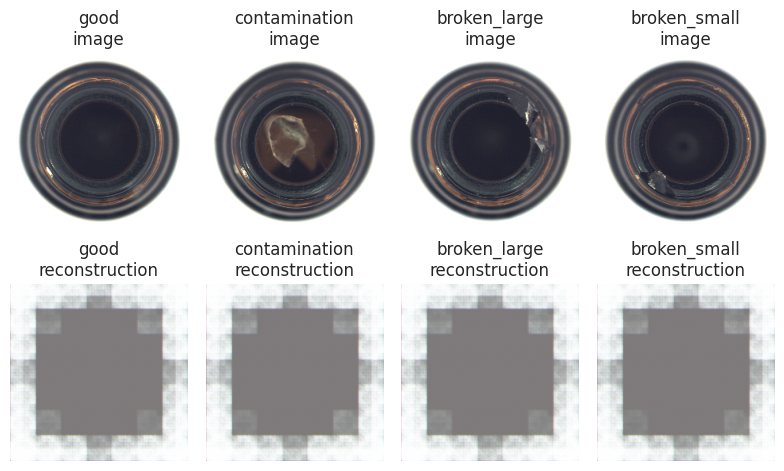


Epoch: [2/20]
TRAIN [    1/   27] loss: 0.0698
TRAIN [   27/   27] loss: 0.0268
TSET  [    1/    1] loss: 0.6586

Test AUROC-image: 0.7071, AUROC-pixel: 0.6482


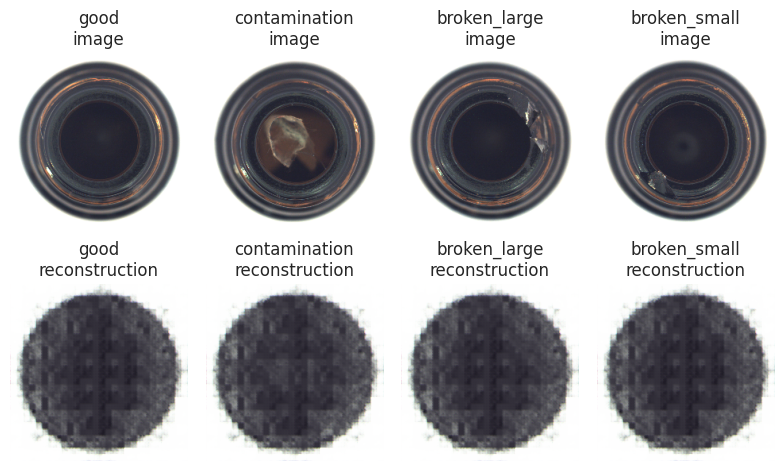


Epoch: [3/20]
TRAIN [    1/   27] loss: 0.0069
TRAIN [   27/   27] loss: 0.0045
TSET  [    1/    1] loss: 0.6074

Test AUROC-image: 0.8611, AUROC-pixel: 0.7163


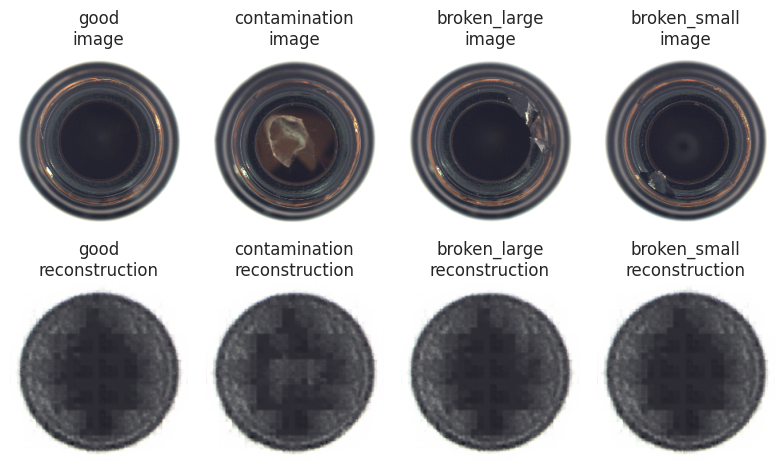


Epoch: [4/20]
TRAIN [    1/   27] loss: 0.0039
TRAIN [   27/   27] loss: 0.0035
TSET  [    1/    1] loss: 0.5907

Test AUROC-image: 0.8778, AUROC-pixel: 0.7276


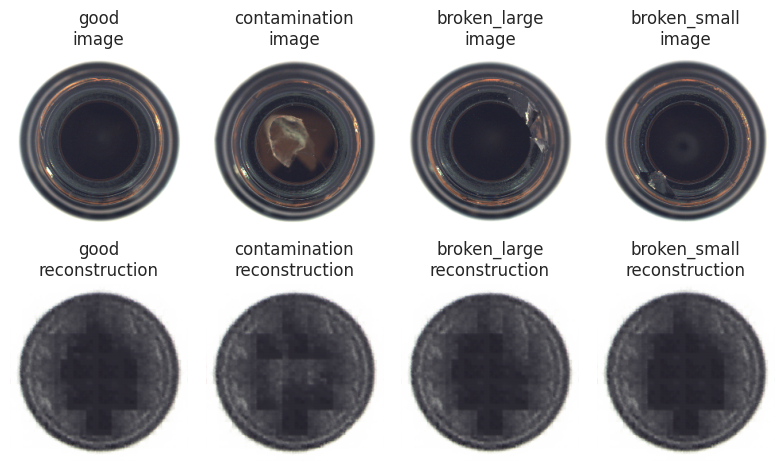


Epoch: [5/20]
TRAIN [    1/   27] loss: 0.0034
TRAIN [   27/   27] loss: 0.0030
TSET  [    1/    1] loss: 0.5780

Test AUROC-image: 0.9175, AUROC-pixel: 0.7418


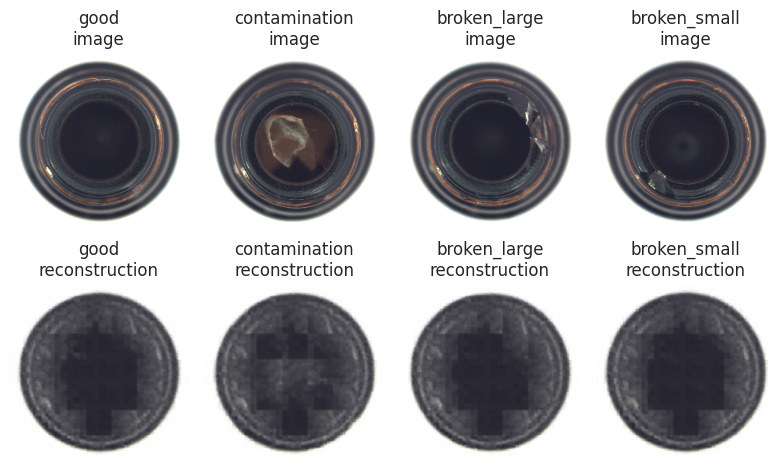


Epoch: [6/20]
TRAIN [    1/   27] loss: 0.0030
TRAIN [   27/   27] loss: 0.0028
TSET  [    1/    1] loss: 0.5748

Test AUROC-image: 0.9262, AUROC-pixel: 0.7385


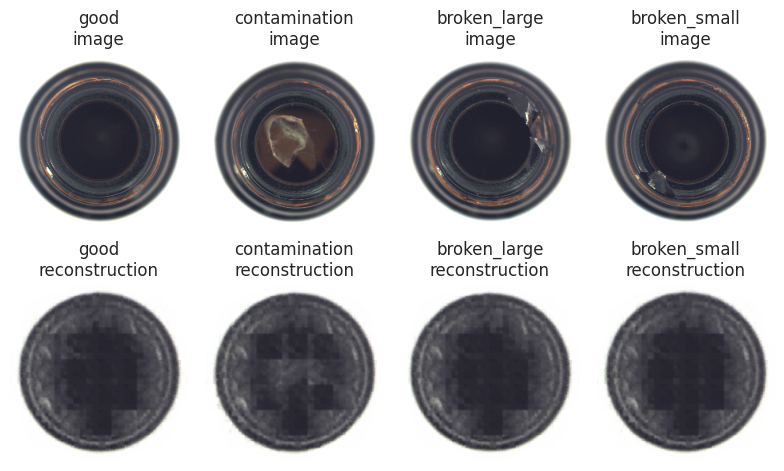


Epoch: [7/20]
TRAIN [    1/   27] loss: 0.0032
TRAIN [   27/   27] loss: 0.0027
TSET  [    1/    1] loss: 0.5636

Test AUROC-image: 0.9000, AUROC-pixel: 0.7437


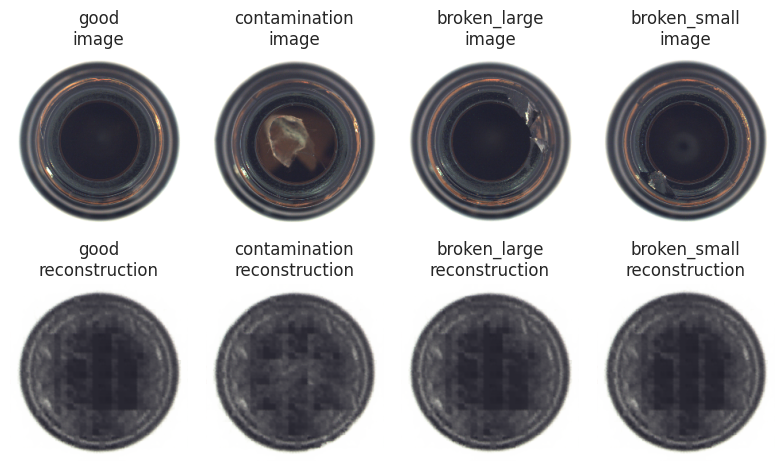


Epoch: [8/20]
TRAIN [    1/   27] loss: 0.0028
TRAIN [   27/   27] loss: 0.0026
TSET  [    1/    1] loss: 0.5762

Test AUROC-image: 0.9302, AUROC-pixel: 0.7593


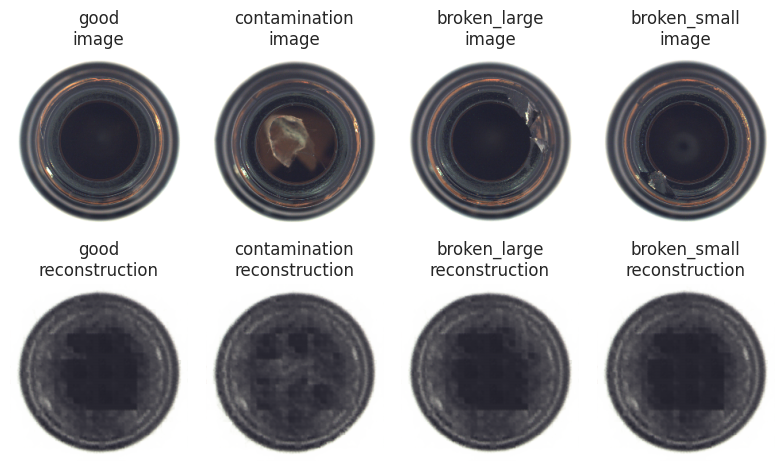


Epoch: [9/20]
TRAIN [    1/   27] loss: 0.0026
TRAIN [   27/   27] loss: 0.0024
TSET  [    1/    1] loss: 0.5704

Test AUROC-image: 0.9190, AUROC-pixel: 0.7674


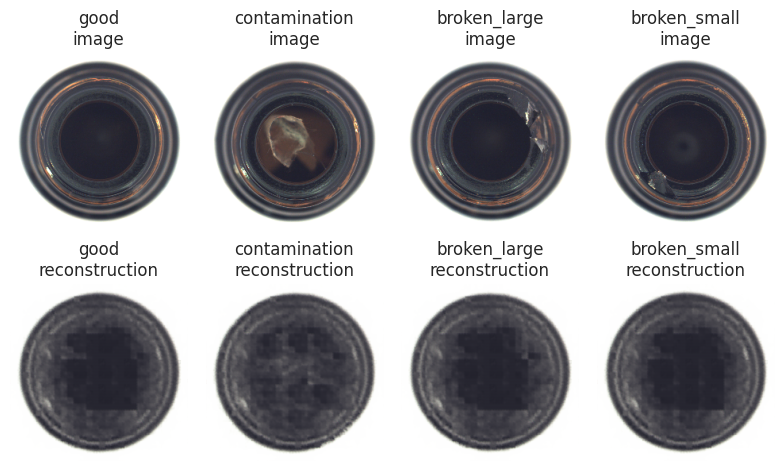


Epoch: [10/20]
TRAIN [    1/   27] loss: 0.0024
TRAIN [   27/   27] loss: 0.0023
TSET  [    1/    1] loss: 0.5613

Test AUROC-image: 0.9167, AUROC-pixel: 0.7635


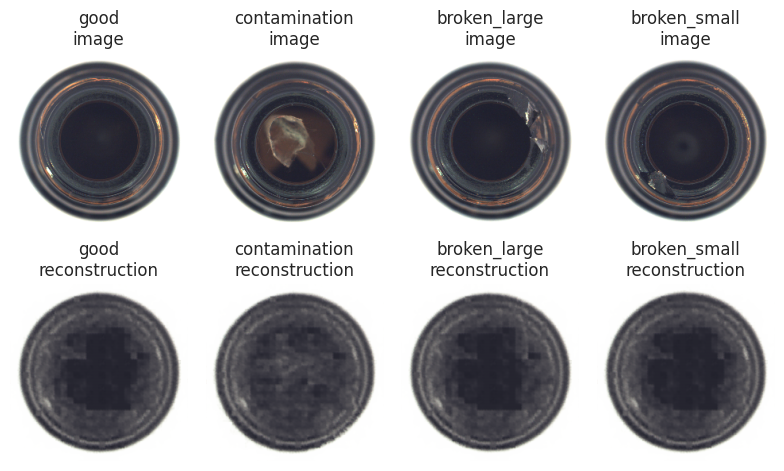


Epoch: [11/20]
TRAIN [    1/   27] loss: 0.0023
TRAIN [   27/   27] loss: 0.0031
TSET  [    1/    1] loss: 0.5841

Test AUROC-image: 0.9294, AUROC-pixel: 0.7622


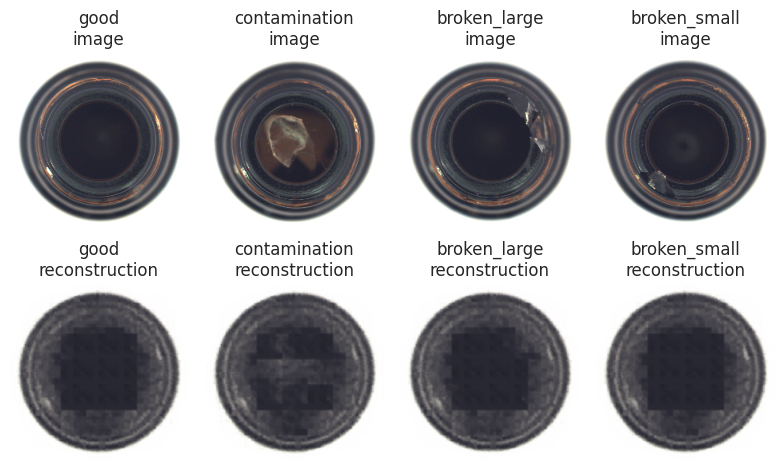


Epoch: [12/20]
TRAIN [    1/   27] loss: 0.0027
TRAIN [   27/   27] loss: 0.0024
TSET  [    1/    1] loss: 0.5706

Test AUROC-image: 0.9389, AUROC-pixel: 0.7734


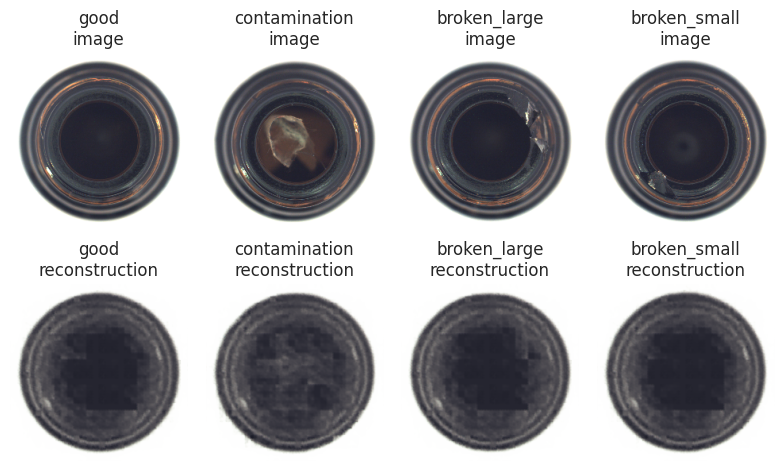


Epoch: [13/20]
TRAIN [    1/   27] loss: 0.0023
TRAIN [   27/   27] loss: 0.0022
TSET  [    1/    1] loss: 0.5668

Test AUROC-image: 0.9262, AUROC-pixel: 0.7702


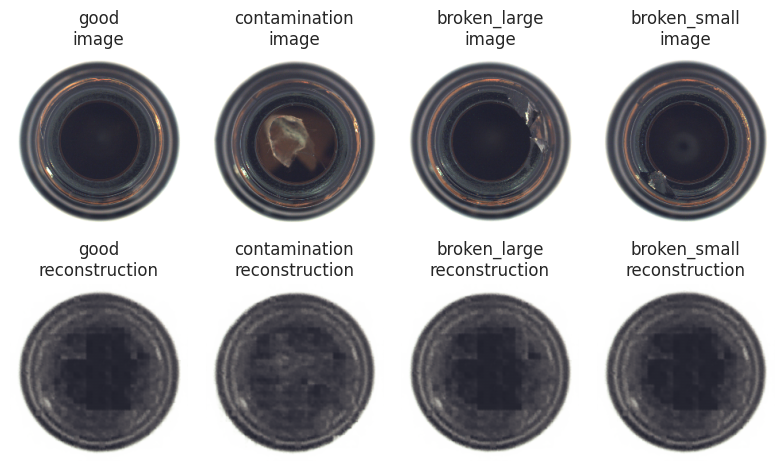


Epoch: [14/20]
TRAIN [    1/   27] loss: 0.0023
TRAIN [   27/   27] loss: 0.0021
TSET  [    1/    1] loss: 0.5610

Test AUROC-image: 0.9175, AUROC-pixel: 0.7662


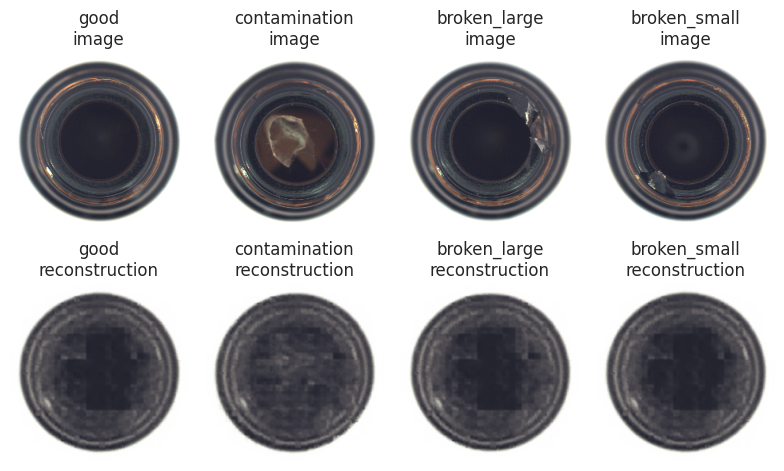


Epoch: [15/20]
TRAIN [    1/   27] loss: 0.0023
TRAIN [   27/   27] loss: 0.0021
TSET  [    1/    1] loss: 0.5616

Test AUROC-image: 0.9175, AUROC-pixel: 0.7711


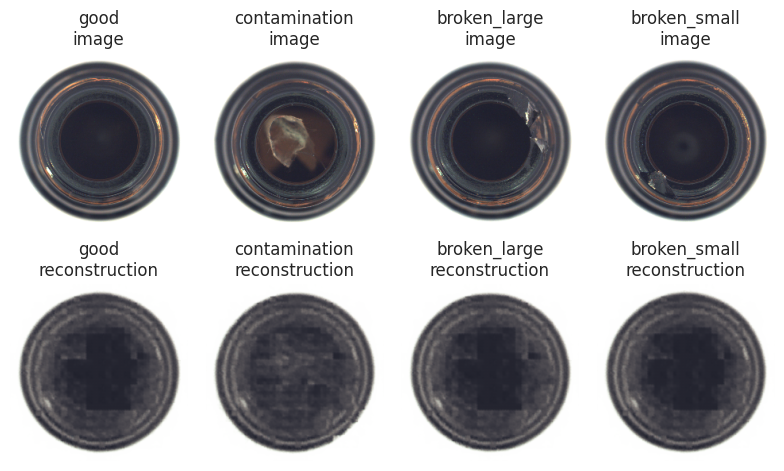


Epoch: [16/20]
TRAIN [    1/   27] loss: 0.0022
TRAIN [   27/   27] loss: 0.0020
TSET  [    1/    1] loss: 0.5635

Test AUROC-image: 0.9230, AUROC-pixel: 0.7781


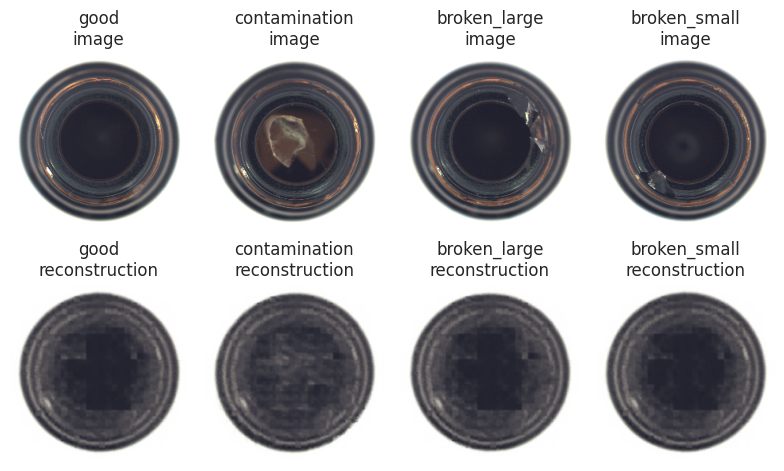


Epoch: [17/20]
TRAIN [    1/   27] loss: 0.0021
TRAIN [   27/   27] loss: 0.0020
TSET  [    1/    1] loss: 0.5563

Test AUROC-image: 0.9190, AUROC-pixel: 0.7644


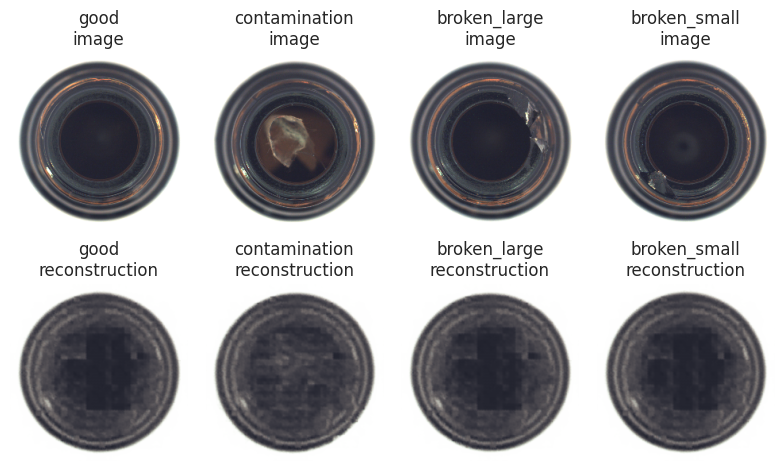


Epoch: [18/20]
TRAIN [    1/   27] loss: 0.0022
TRAIN [   27/   27] loss: 0.0020
TSET  [    1/    1] loss: 0.5607

Test AUROC-image: 0.9238, AUROC-pixel: 0.7786


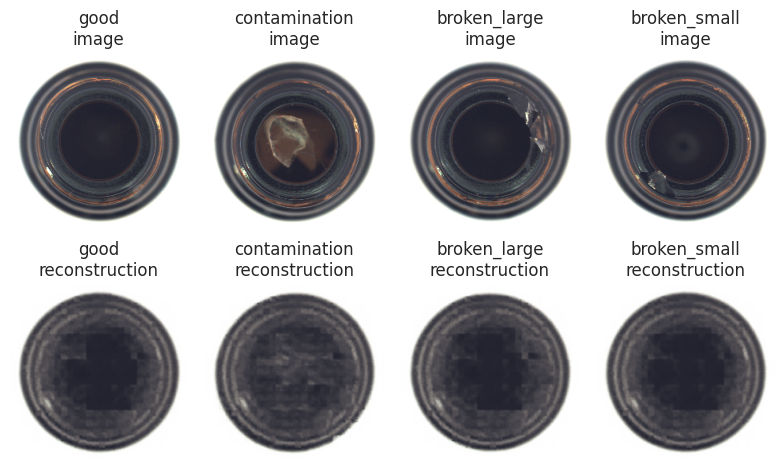


Epoch: [19/20]
TRAIN [    1/   27] loss: 0.0021
TRAIN [   27/   27] loss: 0.0020
TSET  [    1/    1] loss: 0.5571

Test AUROC-image: 0.9246, AUROC-pixel: 0.7702


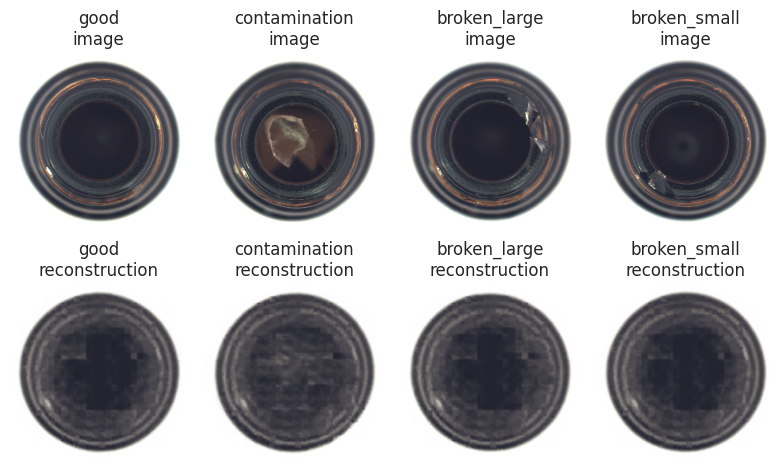


Epoch: [20/20]
TRAIN [    1/   27] loss: 0.0021
TRAIN [   27/   27] loss: 0.0020
TSET  [    1/    1] loss: 0.5556

Test AUROC-image: 0.9135, AUROC-pixel: 0.7732


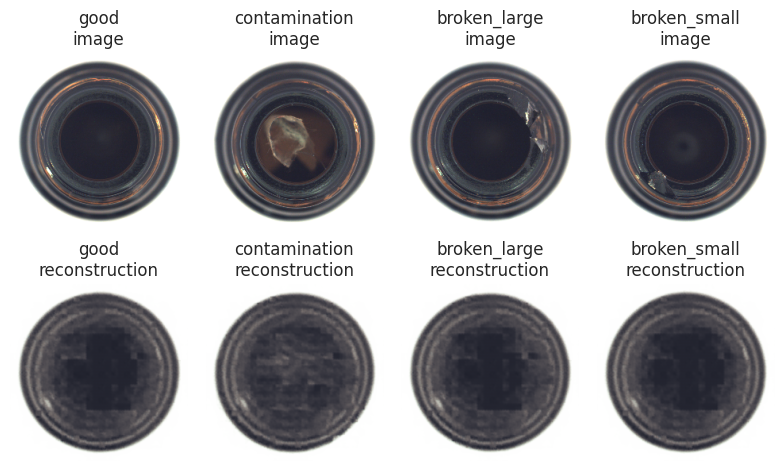

Training completed.


In [14]:
# 시드 설정
torch_seed(cfg.seed)

# Convolutional AutoEncoder 모델 학습 및 평가
train_history_cae_deep, test_history_auroc_img_cae_deep, test_history_auroc_pixel_cae_deep = fit(
    model=cae_deep,                # 학습할 모델
    trainloader=trainloader,       # 학습 데이터 로더
    testloader=testloader,         # 테스트 데이터 로더
    criterion=criterion,           # 손실 함수
    optimizer=optimizer,           # 옵티마이저
    epochs=cfg.epochs,             # 학습 에폭 수
    log_interval=cfg.log_interval, # 로그 출력 간격
    device=cfg.device              # 학습에 사용할 디바이스
)

print("Training completed.")

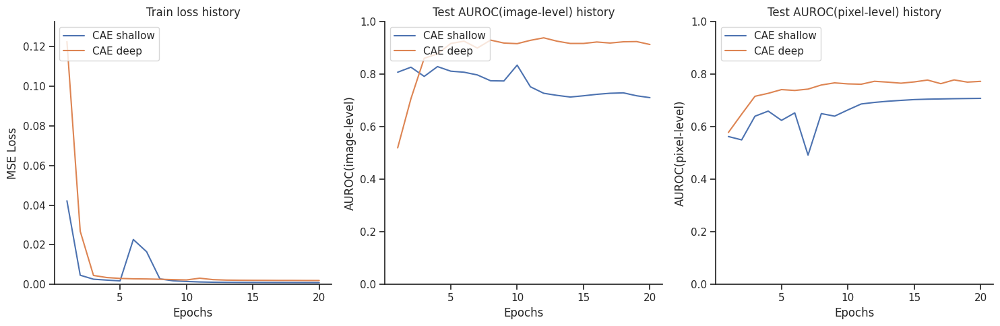

In [15]:
# 깊은 Convolutional AutoEncoder 모델의 학습 및 평가 히스토리를 리스트에 추가
all_train_history.append(train_history_cae_deep)
all_test_history_auroc_img.append(test_history_auroc_img_cae_deep)
all_test_history_auroc_pixel.append(test_history_auroc_pixel_cae_deep)
all_exp_name.append('CAE deep')

# 학습 및 평가 히스토리 시각화
figure(
    all_train_history=all_train_history,                    # 모든 학습 손실 히스토리 리스트
    all_test_history_auroc_img=all_test_history_auroc_img,  # 모든 테스트 이미지 레벨 AUROC 히스토리 리스트
    all_test_history_auroc_pixel=all_test_history_auroc_pixel,  # 모든 테스트 픽셀 레벨 AUROC 히스토리 리스트
    all_exp_name=all_exp_name  # 모든 실험 이름 리스트
)

# Experiment results

In [16]:
# 최종 테스트 AUROC 결과 리스트 생성
auroc_img_list = [
    test_history_auroc_img_cae_shallow[-1],
    test_history_auroc_img_cae_deep[-1]
]

auroc_pixel_list = [
    test_history_auroc_pixel_cae_shallow[-1],
    test_history_auroc_pixel_cae_deep[-1]
]

# 데이터프레임 생성 및 출력
results_df = pd.DataFrame({
    'Model': ['CAE shallow', 'CAE deep'],
    'AUROC(image)': auroc_img_list,
    'AUROC(pixel)': auroc_pixel_list
}).round(4)

# 데이터프레임 출력
print(results_df)

         Model  AUROC(image)  AUROC(pixel)
0  CAE shallow        0.7111        0.7085
1     CAE deep        0.9135        0.7732


# Anomaly score distribution

In [17]:
# 테스트 데이터의 카테고리별 파일 리스트 생성
file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))

# 손실 함수 설정
criterion = nn.MSELoss(reduction='none')

# 추론 및 손실 계산
total_loss = []

# 깊은 Convolutional AutoEncoder 모델을 평가 모드로 설정
cae_deep.eval()

# 추론 과정에서 기울기 계산 비활성화
with torch.no_grad():
    for (inputs, _, _) in testloader:
        # 입력 데이터를 디바이스로 이동
        inputs = inputs.to(cfg.device)
        
        # 모델을 사용하여 출력 계산
        outputs = cae_deep(inputs)
        
        # 손실 계산
        loss = criterion(inputs, outputs)
        
        # 손실 값을 리스트에 추가
        total_loss.extend(loss.flatten(start_dim=1).max(dim=1)[0].cpu().tolist())

# 추론 완료 메시지 출력
print("Inference completed.")

Inference completed.


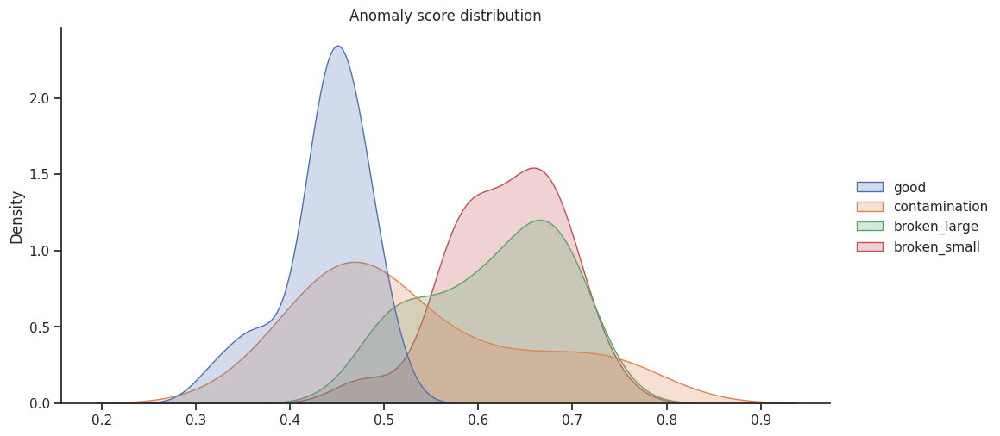

In [18]:
# 손실 분포 시각화
sns.displot(
    x=total_loss,         # x축 데이터로 손실 값을 사용
    hue=file_list_cat,    # 카테고리별 색상을 다르게 하기 위해 파일 리스트의 카테고리를 사용
    kind='kde',           # 커널 밀도 추정(Kernel Density Estimate) 그래프
    fill=True,            # 그래프를 채움
    aspect=2              # 그래프의 종횡비를 2로 설정하여 넓게 표시
)

# 그래프 제목 설정
plt.title('Anomaly score distribution')

# 그래프 출력
plt.show()

# Anomaly visualization

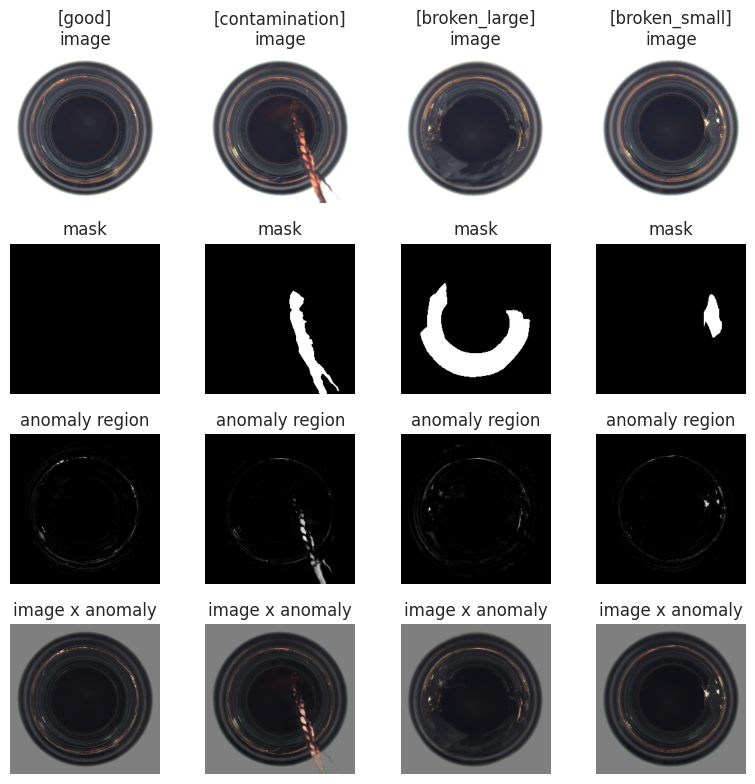

In [19]:
# 테스트 데이터의 카테고리별 파일 리스트 생성
file_list_cat = list(map(lambda x: x.split('/')[-2], testset.file_list))

# 행 이름 설정
row_name = ['image', 'mask', 'anomaly region', 'image x anomaly']

# 서브플롯 생성
fig, ax = plt.subplots(4, len(testset.category), figsize=(2*len(testset.category), 8))

# 손실 함수 설정
criterion = nn.MSELoss(reduction='none')

# Convolutional AutoEncoder 모델을 평가 모드로 설정
cae_deep.eval()

# 각 카테고리별로 샘플 이미지 시각화
for i, c in enumerate(testset.category):
    # 각 카테고리의 샘플 인덱스 가져오기
    idx = np.where(np.array(file_list_cat) == c)[0][2]

    # 이미지와 마스크 가져오기
    img, mask, _ = testset[idx]

    # 손실 및 출력 계산
    with torch.no_grad():
        output = cae_deep(img.unsqueeze(0).to(cfg.device))[0].cpu()
        loss = criterion(img, output).max(dim=0)[0]

    # 손실 값 스케일링
    loss = (loss - loss.min()) / (loss.max() - loss.min())

    # 이미지 시각화
    ax[0, i].imshow(img.permute(1, 2, 0))  # 이미지
    ax[1, i].imshow(mask, cmap='gray')     # 마스크
    ax[2, i].imshow(loss, cmap='gray')     # 손실 맵
    ax[3, i].imshow(img.permute(1, 2, 0) * 0.5 + (loss * 0.5).unsqueeze(-1))  # 이미지 x 손실 맵

    # 축을 끄기
    ax[0, i].axis('off')
    ax[1, i].axis('off')
    ax[2, i].axis('off')
    ax[3, i].axis('off')

    # 타이틀 설정
    for r_idx, ax_r in enumerate(ax[:, i]):
        ax_r.set_title(f'[{c}]\n{row_name[r_idx]}' if r_idx == 0 else row_name[r_idx])

# 레이아웃 조정 및 그래프 출력
plt.tight_layout()
plt.show()

---